In [ ]:
using Pkg
Pkg.add("JuMP")
Pkg.add("Ipopt")
Pkg.add("Combinatorics")
Pkg.add("DifferentialEquations")
Pkg.add("PyPlot")
Pkg.add("ColorTypes")
Pkg.add("Plots")
Pkg.add("PyCall")
Pkg.build("PyCall")

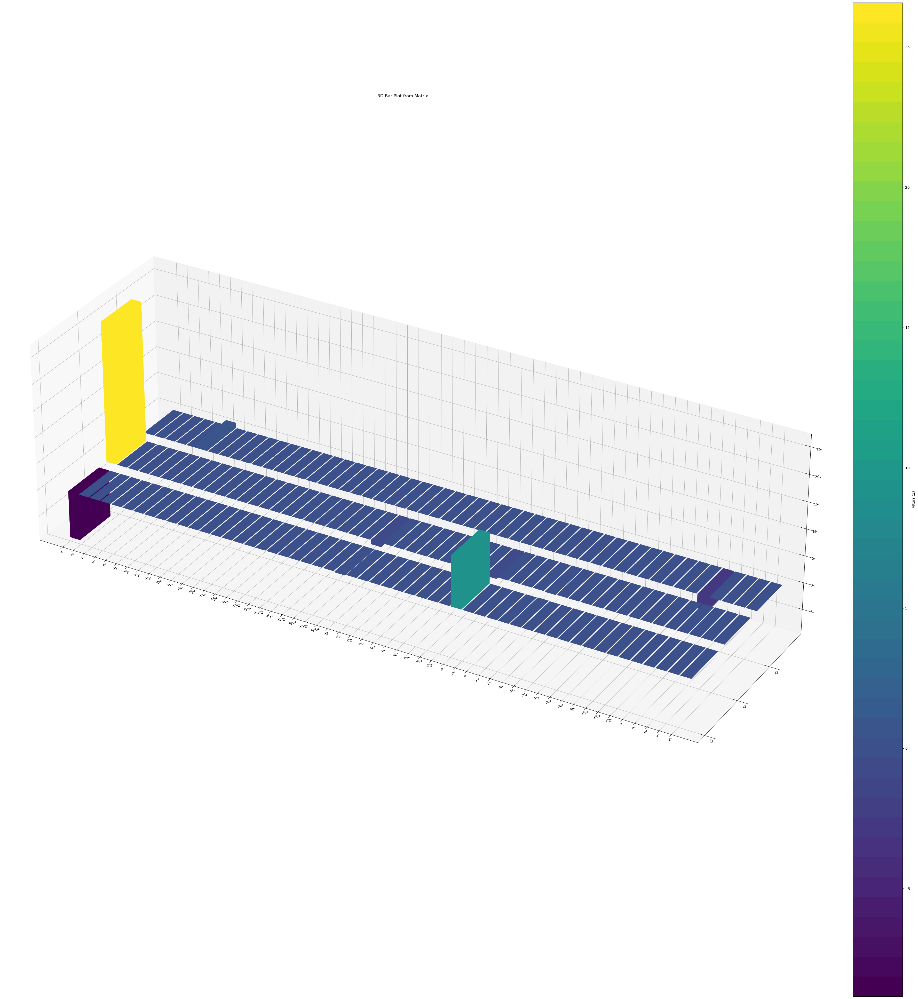

In [10]:
using PyPlot
using ColorTypes

function bar3D_matrix_colormap(data_matrix, colormap=:viridis)
    rows, cols = size(data_matrix)

    fig = figure(figsize=(50, 50))  # Ajuste o tamanho do gráfico aqui
    ax = fig.add_subplot(111, projection="3d")

    # Criar vetores para as posições de ancoragem das barras
    xpos = repeat(1:rows, outer=cols)
    ypos = repeat(1:cols, inner=rows)

    zpos = zeros(rows * cols)
    dx = dy = ones(rows * cols)
    dy *= 0.8
    dx *= 0.9
    dz = reshape(data_matrix, rows * cols)

    # Escolher um colormap
    cmap = get_cmap(colormap,50)

    # Normalizar as alturas para corresponder à faixa de cores do colormap
    normalized_heights = (dz .- minimum(dz)) / (maximum(dz) - minimum(dz))

    # Especificar as cores das barras usando o colormap
    colors = cmap.(normalized_heights)

    bars = bar3D(xpos, ypos, zpos, dx, dy, dz, color=colors,shade=false)

    title("3D Bar Plot from Matrix")

    # Adicionar rótulos para as colunas (eixo Y)
    PyPlot.xticks(1:rows, ["x", "x²", "x³", "x⁴", "x⁵", "xy", "x²y", "x³y", "x⁴y", "xy²", "xy³", "xy⁴", "x²y²", "x²y³", "x³y²", "xyz", "x²yz", "xy²z", "x²y²z", "x³yz", "xy³z", "xyz²", "x²yz²", "xy²z²", "xz", "x²z", "x³z", "x⁴z", "xz²", "xz³", "xz⁴", "x²z²", "x²z³", "x³z²", "y", "y²", "y³", "y⁴", "y⁵", "yz", "y²z", "y³z", "y⁴z", "yz²", "yz³", "yz⁴", "y²z²", "y²z³", "y³z²", "z", "z²", "z³", "z⁴", "z⁵"])

    # Adicionar rótulos para as linhas (eixo X)
    PyPlot.yticks(1:cols, ["ξ1","ξ2","ξ3"])

    # Adicionar uma barra de cores para referência
    mappable = matplotlib.cm.ScalarMappable(cmap=cmap)
    mappable.set_array(dz)
    cbar = colorbar(mappable)
    cbar.set_label("Altura (Z)")

    # Definir limites para centralizar o eixo Z em zero
    ax.set_xlim(0, rows + 1)
    ax.set_zlim(bottom=min(0, minimum(dz)), top=max(0, maximum(dz)))

    # Ajustar a proporção dos eixos para evitar que o eixo X seja espremido
    ax.set_box_aspect([rows/cols, rows/cols*0.3, rows/cols*0.3])

    return fig, ax
end

fig, ax = bar3D_matrix_colormap(ξ_values)
show()


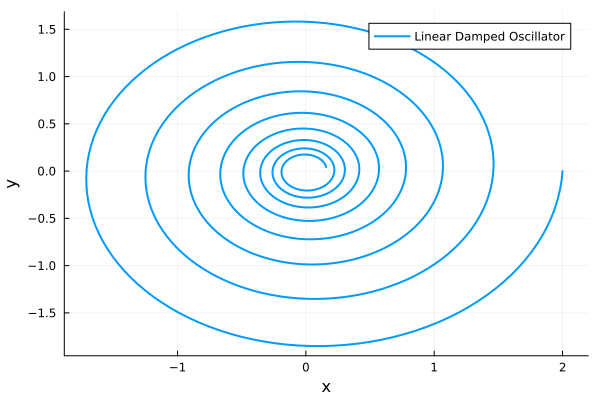

In [75]:
using DifferentialEquations
using Plots

function linear_damped_oscillator!(du, u, p, t)
    du[1] = -0.1u[1] + 2u[2]
    du[2] = - 2u[1] - 0.1u[2]
end

# Initial conditions
u0_linear = [2.0, 0.0]

# Time span
tspan = (0.0, 25.0)

# Solve ODE for linear damped oscillator
prob_linear = ODEProblem(linear_damped_oscillator!, u0_linear, tspan)
sol_linear = solve(prob_linear)

# Plot the results
plot(sol_linear, vars=(1, 2), xlabel="x", ylabel="y", label="Linear Damped Oscillator", linewidth=2)

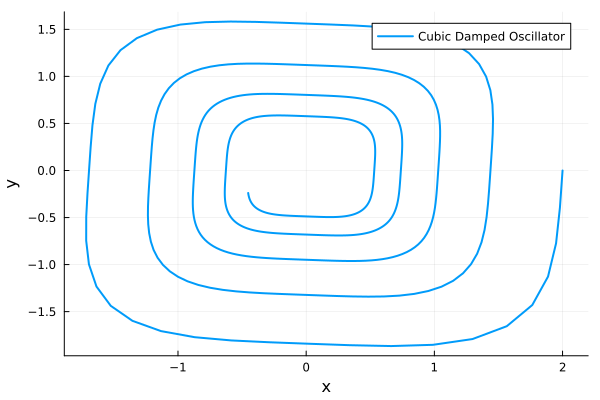

In [20]:
function cubic_damped_oscillator!(du, u, p, t)
    du[1] = -0.1u[1]^3 + 2u[2]^3
    du[2] = - 2u[1]^3 - 0.1u[2]^3
end

# Initial conditions
u0_cubic = [2.0, 0.0]

# Time span
tspan = (0.0, 25.0)

# Solve ODE for cubic damped oscillator
prob_cubic = ODEProblem(cubic_damped_oscillator!, u0_cubic, tspan)
sol_cubic = solve(prob_cubic)

# Plot the results
plot(sol_cubic, vars=(1, 2), xlabel="x", ylabel="y", label="Cubic Damped Oscillator", linewidth=2)

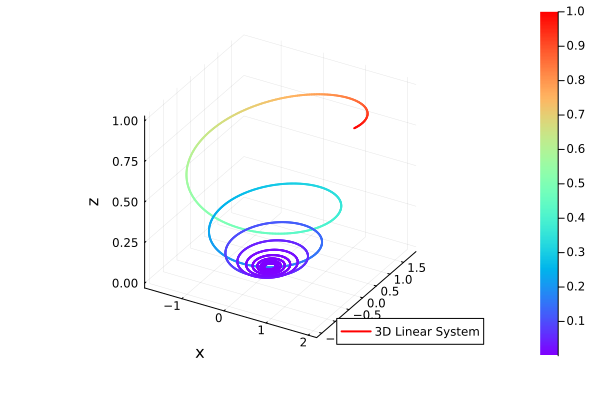

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


In [2]:
using DifferentialEquations, Plots

function linear_3d_system!(du, u, p, t)
    du[1] = -0.1u[1] - 2u[2]
    du[2] = 2u[1] - 0.1u[2]
    du[3] = -0.3u[3]
end

# Initial conditions
u0_3d_linear = [2.0, 0.0, 1.0]

# Time span
tspan = (0.0, 30.0)

# Solve ODE for three-dimensional linear system
prob_3d_linear = ODEProblem(linear_3d_system!, u0_3d_linear, tspan)
sol_3d_linear = solve(prob_3d_linear, saveat=0.01)

line_z = sol_3d_linear[3, :]
# Plot the results
plot_obj = plot(sol_3d_linear, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="3D Linear System", linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)
display(plot_obj)

In [1]:
using DifferentialEquations
using Plots

function lorenz!(du, u, p, t)
    σ, ρ, β = p
    du[1] = σ * (u[2] - u[1])
    du[2] = u[1] * (ρ - u[3]) - u[2]
    du[3] = u[1] * u[2] - β * u[3]
end

# Initial conditions and common parameters for the Lorenz System
u0 = [0.1, 0.0, 0.0]
p = [10.0, 28.0, 8/3]

# Time span
tspan = (0.0, 60.0) 

# Solve the differential equations
prob = ODEProblem(lorenz!, u0, tspan, p)
sol = solve(prob, Tsit5(), saveat=0.01)  # Reduce the number of data points

# Create an array for line_z representing time
line_z = sol[3, :]

# Plot the results with rainbow gradient
#= plot_obj = plot(sol, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="Lorenz System",
     linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)
display(plot_obj) =#


6001-element Vector{Float64}:
  0.0
  1.2639097554290945e-5
  4.655608392523517e-5
  9.836493652355502e-5
  0.00016736413347414903
  0.00025490858914697673
  0.00036411137086443966
  0.0004997803970600264
  0.0006685282539265705
  0.0008790766607140421
  0.0011425675093692377
  0.001473361123558005
  0.0018896798774316063
  ⋮
 30.826508069390936
 30.417704718626485
 29.984495018700965
 29.5328316295992
 29.068064584171445
 28.594941288131437
 28.11760652005736
 27.639602095635393
 27.163835449366335
 26.692821115917845
 26.22881727562324
 25.773788784769344

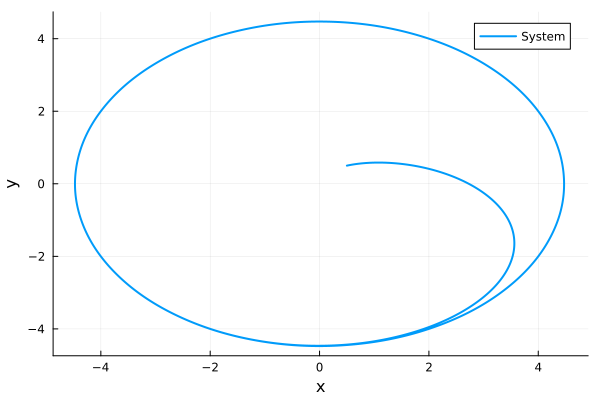

In [23]:
using DifferentialEquations
using Plots

function system!(du, u, p, t)
    μ, ω, A = p
    du[1] = μ * u[1] + ω * u[2] - A * u[1] * (u[1]^2 + u[2]^2)
    du[2] = -ω * u[1] + μ * u[2] - A * u[2] * (u[1]^2 + u[2]^2)
end

# Condições iniciais e parâmetros comuns para o sistema
u0 = [0.5, 0.5]
p = [2.0, 1.0, 0.1]  # μ, ω, A

# Intervalo de tempo
tspan = (0.0, 10.0)

# Resolver as equações diferenciais
prob = ODEProblem(system!, u0, tspan, p)
sol = solve(prob)

# Plotar os resultados
plot(sol, vars=(1, 2), xlabel="x", ylabel="y", label="System", linewidth=2)

# Resolvendo o problema de otimização

In [4]:
using Combinatorics

function generate_theta_2d(X)
    n, p = size(X)
    combinations = []
    for i in 1:p
        push!(combinations, X[:, i])
        push!(combinations, X[:, i].^2)
        push!(combinations, X[:, i].^3)
        push!(combinations, X[:, i].^4)
        push!(combinations, X[:, i].^5)
        for j in i+1:p
            push!(combinations, X[:, i] .* X[:, j])
            push!(combinations, X[:, i].^2 .* X[:, j])
            push!(combinations, X[:, i].^3 .* X[:, j])
            push!(combinations, X[:, i].^4 .* X[:, j])
            push!(combinations, X[:, i] .* X[:, j].^2)
            push!(combinations, X[:, i] .* X[:, j].^3)
            push!(combinations, X[:, i] .* X[:, j].^4)
            push!(combinations, X[:, i].^2 .* X[:, j].^2)
            push!(combinations, X[:, i].^2 .* X[:, j].^3)
        end
    end
    return hcat(combinations...)
end

# Example usage
X = [2 3; 2 4]  # Replace x1, x2, x3 with actual values
theta_matrix = generate_theta(X)

# Print the matrix
println(theta_matrix)


[2 4 8 16 32 6 12 24 48 18 54 162 36 108 3 9 27 81 243; 2 4 8 16 32 8 16 32 64 32 128 512 64 256 4 16 64 256 1024]


In [6]:
using Combinatorics

function generate_theta(X)
    n, p = size(X)
    combinations = []  # Inicializa uma lista para armazenar as combinações
    for i in 1:p
        push!(combinations, X[:, i])  # Adiciona X_i (variável original)
        push!(combinations, X[:, i].^2)  # Adiciona X_i^2
        push!(combinations, X[:, i].^3)  # Adiciona X_i^3
        push!(combinations, X[:, i].^4)  # Adiciona X_i^4
        push!(combinations, X[:, i].^5)  # Adiciona X_i^5
        for j in i+1:p
            push!(combinations, X[:, i] .* X[:, j])  # Adiciona X_i * X_j
            push!(combinations, X[:, i].^2 .* X[:, j])  # Adiciona X_i^2 * X_j
            push!(combinations, X[:, i].^3 .* X[:, j])  # Adiciona X_i^3 * X_j
            push!(combinations, X[:, i].^4 .* X[:, j])  # Adiciona X_i^4 * X_j
            push!(combinations, X[:, i] .* X[:, j].^2)  # Adiciona X_i * X_j^2
            push!(combinations, X[:, i] .* X[:, j].^3)  # Adiciona X_i * X_j^3
            push!(combinations, X[:, i] .* X[:, j].^4)  # Adiciona X_i * X_j^4
            push!(combinations, X[:, i].^2 .* X[:, j].^2)  # Adiciona X_i^2 * X_j^2
            push!(combinations, X[:, i].^2 .* X[:, j].^3)  # Adiciona X_i^2 * X_j^3
            push!(combinations, X[:, i].^3 .* X[:, j].^2)  # Adiciona X_i^3 * X_j^2
            for k in j+1:p  # Loop adicional para a terceira variável
                push!(combinations, X[:, i] .* X[:, j] .* X[:, k])  # Adiciona X_i * X_j * X_k
                push!(combinations, X[:, i].^2 .* X[:, j] .* X[:, k])  # Adiciona X_i^2 * X_j * X_k
                push!(combinations, X[:, i] .* X[:, j].^2 .* X[:, k])  # Adiciona X_i * X_j^2 * X_k
                push!(combinations, X[:, i].^2 .* X[:, j].^2 .* X[:, k])  # Adiciona X_i^2 * X_j^2 * X_k
                push!(combinations, X[:, i].^3 .* X[:, j] .* X[:, k])  # Adiciona X_i^3 * X_j * X_k
                push!(combinations, X[:, i] .* X[:, j].^3 .* X[:, k])  # Adiciona X_i * X_j^3 * X_k
                push!(combinations, X[:, i] .* X[:, j] .* X[:, k].^2)  # Adiciona X_i * X_j * X_k^2
                push!(combinations, X[:, i].^2 .* X[:, j] .* X[:, k].^2)  # Adiciona X_i^2 * X_j * X_k^2
                push!(combinations, X[:, i] .* X[:, j].^2 .* X[:, k].^2)  # Adiciona X_i * X_j^2 * X_k^2
            end
        end
    end
    return hcat(combinations...)  # Concatena as combinações em uma matriz
end

# Examplo de uso da função
X = [2 3 5; 1 4 8] # Define uma matriz de exemplo
theta_matrix = generate_theta(X)

2×54 Matrix{Int64}:
 2  4  8  16  32  6  12  24  48  18  …  1125   675  5  25  125   625   3125
 1  1  1   1   1  4   4   4   4  16     8192  4096  8  64  512  4096  32768

In [7]:
# Extrair os valores da solução
σ, ρ, β = p
t_values = sol.t
dxdt_values = [σ * (sol[2, i] - sol[1, i]) for i in 1:length(t_values)]
dydt_values = [sol[1, i] * (ρ - sol[3, i]) - sol[2, i] for i in 1:length(t_values)]
dzdt_values = [sol[1, i] * sol[2, i] - β * sol[3, i] for i in 1:length(t_values)]

x_values = sol[1, :]
y_values = sol[2, :]
z_values = sol[3, :]

X_dot = hcat(dxdt_values, dydt_values, dzdt_values)
X = hcat(x_values, y_values, z_values)

theta_matrix = generate_theta(X)

using JuMP, Ipopt
λ = 0.1
m = Model(Ipopt.Optimizer)
set_optimizer_attribute(m, "print_level", 0)

# Corrigir a definição da variável ξ
@variable(m, ξ[1:length(theta_matrix[1,:]), 1:3])
@variable(m, t[1:length(theta_matrix[1,:]), 1:3])

# Adicionar restrições epigráficas
@constraint(m, ξ .<= t)
@constraint(m, -ξ .<= t)

@objective(m, Min, sum((X_dot - theta_matrix*ξ).^2) + λ * sum(t[i, j] for i in 1:length(theta_matrix[1,:]), j in 1:3))
optimize!(m)
#= println(m) =#
ξ_values = value.(ξ)

54×3 Matrix{Float64}:
 -8.84278      26.5815        9.94403e-6
 -0.00623146    0.00904642    0.000831297
 -0.00537025    0.00722184    3.85529e-5
 -3.31887e-5    4.19197e-5   -1.58088e-6
 -2.31404e-6    1.798e-6      6.8064e-8
 -6.83278e-6   -2.8077e-5     0.997685
  0.00554285   -0.00681949   -7.4832e-5
  9.59263e-5   -0.000108549  -7.27448e-6
  1.55137e-5   -1.80779e-5   -1.5355e-7
 -0.000109266  -0.000403411   4.93264e-5
  7.15582e-5   -9.04771e-5   -1.18725e-6
 -5.26218e-7    5.46555e-7    4.27864e-9
 -0.000129075   0.000154534   5.9228e-6
  ⋮                          
  2.70674e-7   -3.5479e-7     3.39572e-9
 -0.00265616    0.00350803   -5.92859e-8
  3.6487e-5    -5.45963e-5   -7.73108e-8
 -1.3518e-8     1.46552e-7    2.50524e-9
  6.51241e-6   -7.85687e-6   -9.42543e-7
 -6.10085e-9   -9.68301e-9    2.99086e-8
 -3.90878e-7    5.91117e-7    4.07203e-9
 -0.00140405    0.00190314   -2.66575
  0.000404607  -0.00052599   -0.0002554
 -3.77904e-5    4.75956e-5    2.57547e-5
  1.46367e-6  

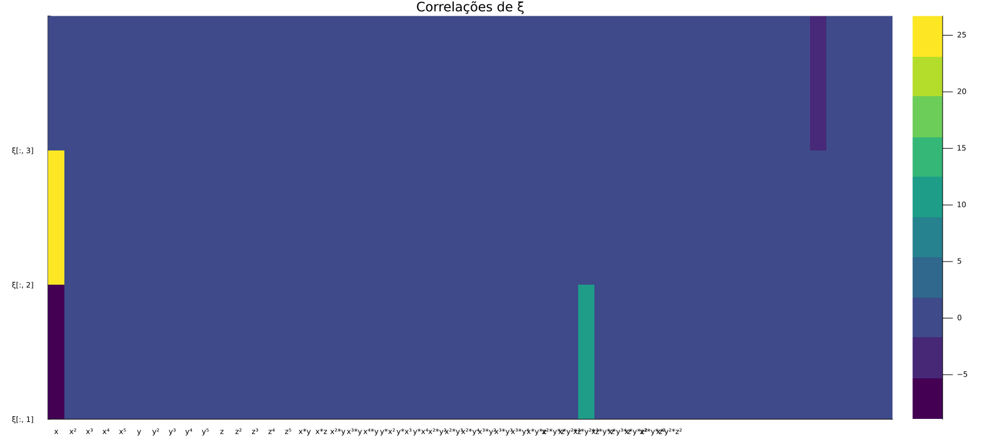

In [41]:
using Plots

# Plotar a esparsidade de ξ
function plot_sparsity(ξ_matrix, column_labels)
    p = heatmap(ξ_matrix', c=cgrad(:viridis, 10, categorical=true), xlabel="", ylabel="Colunas de ξ", yticks=0.5:1:size(ξ_matrix, 2)+0.5, title=["Correlações de ξ" "ξ[:, 2]"], size=(1600, 700))

    # Adicionar rótulos às colunas
    xticks!(1:length(column_labels), column_labels)
    # Adicionar rótulos às linhas
    yticks!(0.5:1:size(ξ_matrix, 2)+0.5, ["ξ[:, $i]" for i in 1:size(ξ_matrix, 2)], valign=:center)
    
    display(p)
end

# Exemplo de uso
column_labels = ["x", "x²", "x³", "x⁴", "x⁵", "y", "y²", "y³", "y⁴", "y⁵", "z", "z²", "z³", "z⁴", "z⁵", "x*y", "x*z", "x²*y", "x³*y", "x⁴*y", "y*x²", "y*x³", "y*x⁴", "x²*y²", "x²*y³", "x²*y⁴", "x³*y²", "x³*y³", "x³*y⁴", "x*y*z", "x²*y*z", "x*y²*z", "x²*y²*z", "x³*y*z", "x*y³*z", "x*y*z²", "x²*y*z²", "x*y²*z²"]
plot_sparsity(ξ_values, column_labels)


In [4]:
# Extrair as derivadas reconstruídas
xyz_dot_reconstructed = theta_matrix * ξ_values
x_dot_reconstructed = xyz_dot_reconstructed[:, 1]
y_dot_reconstructed = xyz_dot_reconstructed[:, 2]
z_dot_reconstructed = xyz_dot_reconstructed[:, 3]

# Integrar numericamente para obter as variáveis originais
x_reconstructed = cumsum(x_dot_reconstructed) * (t_values[2] - t_values[1])
y_reconstructed = cumsum(y_dot_reconstructed) * (t_values[2] - t_values[1])
z_reconstructed = cumsum(z_dot_reconstructed) * (t_values[2] - t_values[1])

#= plot_obj = plot(x_reconstructed, y_reconstructed, z_reconstructed, 
     xlabel="x", ylabel="y", zlabel="z", 
     label="Lorenz System (Reconstructed)", 
     linewidth=2, linecolor=:auto, color=:rainbow1, legend=:topright, line_z=z_reconstructed)
display(plot_obj) =#

6001-element Vector{Float64}:
  9.026473815741513e-8
  2.4244437446526627e-5
  6.744173790232036e-5
  0.0001277926621847123
  0.0002057067050095113
  0.00030345245464927017
  0.00042498906961683966
  0.0005759985029994507
  0.000764082960786842
  0.0009991107823720436
  ⋮
 31.355237444991662
 30.885837471773886
 30.410201573012856
 29.93211751558666
 29.45479915691146
 28.981008872390166
 28.51315704872622
 28.05333458148436
 27.603375471277367

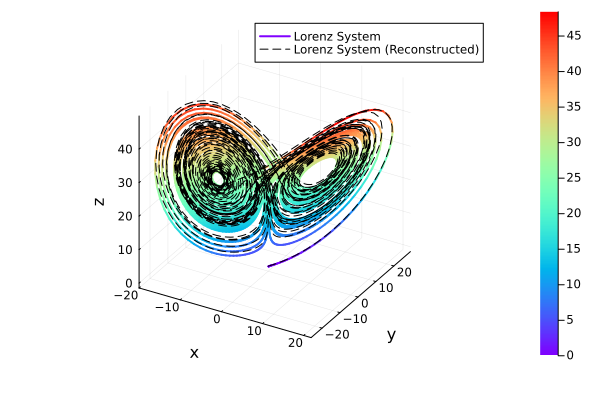

In [13]:
plot(sol, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="Lorenz System",
     linewidth=2, linecolor=:auto, color=:rainbow1, line_z=sol[3, :])

plot!(x_reconstructed, y_reconstructed, z_reconstructed, 
xlabel="x", ylabel="y", zlabel="z", 
label="Lorenz System (Reconstructed)", 
linewidth=1, linestyle=:dash, linecolor=:auto, color=:black, legend=:topright)




In [37]:
using Pkg
Pkg.add("PlotlyJS")

   Resolving package versions...


  No Changes to `C:\Users\linco\.julia\environments\v1.9\Project.toml`


  No Changes to `C:\Users\linco\.julia\environments\v1.9\Manifest.toml`


In [6]:
using PlotlyJS

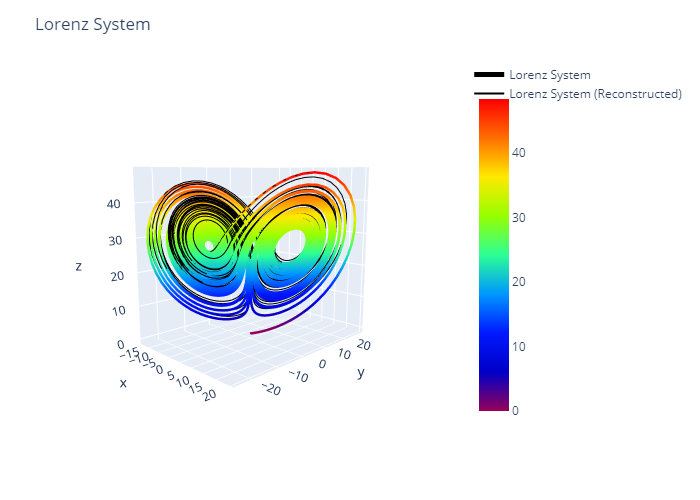

In [55]:
using PlotlyJS
import PlotlyJS: scatter, Layout, plot, relayout!, attr

trace1 = scatter(
    x = sol[1, :],
    y = sol[2, :],
    z = sol[3, :],
    mode = "lines",
    line = attr(
        width = 5,
        color = sol[3, :],
        colorscale = "Rainbow",
        opacity = 0.5,
        colorbar = attr(
            len = 0.85,  # Ajuste o comprimento da colorbar
        ),
    ),
    type = "scatter3d",
    name = "Lorenz System"
)

trace2 = scatter(
    x = x_reconstructed,
    y = y_reconstructed,
    z = z_reconstructed,
    mode = "lines",
    line = attr(
        width = 2,
        color = "black",        
        opacity = 1
    ),  
    type = "scatter3d",
    name = "Lorenz System (Reconstructed)"
)

layout = Layout(
    title = "Lorenz System",
    scene = attr(
        xaxis = attr(title = "x"),
        yaxis = attr(title = "y"),
        zaxis = attr(title = "z")
    ),
    margin = attr(
        l = 0,  # Ajuste a margem esquerda
        r = 200,  # Ajuste a margem direita
        b = 0,  # Ajuste a margem inferior
        t = 100  # Ajuste a margem superior
    ),
    width = 800,  # Ajuste a largura da figura
    height = 600  # Ajuste a altura da figura
)

# Renomeando a função plot para evitar conflito
plotly_plot = plot([trace1, trace2], layout)

camera = attr(
    center = attr(x = 0, y = 0, z = 0),
    eye = attr(x = 2, y = -2, z = 0.5)
)

relayout!(plotly_plot, scene_camera = camera)
plotly_plot


# Adicionando Ruído

In [42]:
# Extrair os valores da solução
σ, ρ, β = p
t_values = sol.t
# Adição de ruído às derivadas
noise_intensity = 1
dxdt_values = [σ * (sol[2, i] - sol[1, i]) + noise_intensity * randn() for i in 1:length(sol.t)]
dydt_values = [sol[1, i] * (ρ - sol[3, i]) - sol[2, i] + noise_intensity * randn() for i in 1:length(sol.t)]
dzdt_values = [sol[1, i] * sol[2, i] - β * sol[3, i] + noise_intensity * randn() for i in 1:length(sol.t)]

x_values = sol[1, :]
y_values = sol[2, :]
z_values = sol[3, :]

X_dot = hcat(dxdt_values, dydt_values, dzdt_values)
X = hcat(x_values, y_values, z_values)

theta_matrix = generate_theta(X)

using JuMP, Ipopt
λ = 0.1
m = Model(Ipopt.Optimizer)
set_optimizer_attribute(m, "print_level", 0)

# Corrigir a definição da variável ξ
@variable(m, ξ[1:length(theta_matrix[1,:]), 1:3])
@variable(m, t[1:length(theta_matrix[1,:]), 1:3])

# Adicionar restrições epigráficas
@constraint(m, ξ .<= t)
@constraint(m, -ξ .<= t)

@objective(m, Min, sum((X_dot - theta_matrix*ξ).^2) + λ * sum(t[i, j] for i in 1:length(theta_matrix[1,:]), j in 1:3))
optimize!(m)
#= println(m) =#
ξ_values = value.(ξ)

51×3 Matrix{Float64}:
 -6.82534      32.5261       -0.457328
  0.249612      0.904872      0.334889
 -0.00665916   -0.0111219    -0.00663037
 -0.00105872   -4.85639e-5   -0.00171462
 -5.53406e-5    8.51583e-6   -2.74275e-5
 -0.575435     -1.23974       0.182183
 -0.0486257     0.018114      0.012862
  0.00326721    0.00165979    0.0017512
  0.000113596  -3.35581e-5    3.51945e-5
  0.0756911    -0.0168454    -0.00733655
  ⋮                          
  0.000234644   0.000228768   9.77137e-5
 -1.16275e-6   -1.26752e-6   -1.60782e-6
  0.000328889   0.000390885   0.00016259
  4.20454e-7   -1.52671e-6    4.71174e-6
 -0.0420933    -0.103264     -2.70931
  0.00855356    0.0227853     0.0148814
 -0.000396578  -0.00179975   -0.00167395
 -3.36238e-6    6.08797e-5    7.86018e-5
  3.61081e-7   -7.71533e-7   -1.3588e-6

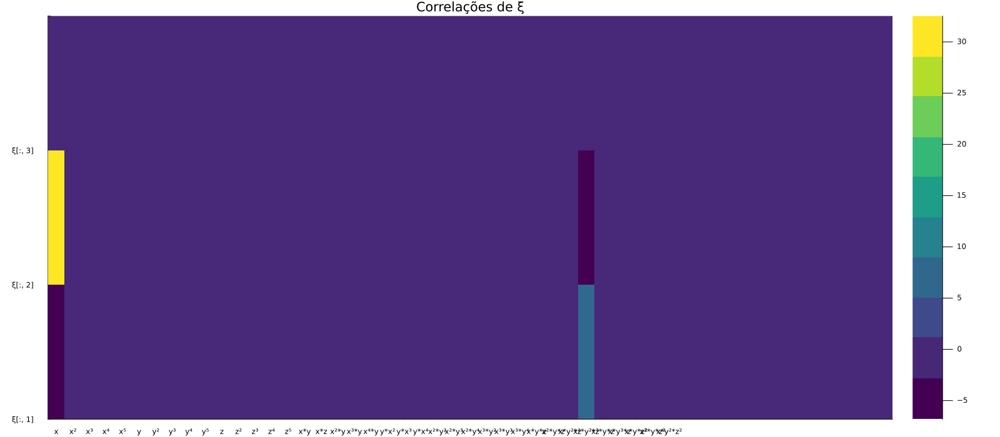

In [43]:
using Plots

# Plotar a esparsidade de ξ
function plot_sparsity(ξ_matrix, column_labels)
    p = heatmap(ξ_matrix', c=cgrad(:viridis, 10, categorical=true), xlabel="", ylabel="Colunas de ξ", yticks=0.5:1:size(ξ_matrix, 2)+0.5, title=["Correlações de ξ" "ξ[:, 2]"], size=(1600, 700))

    # Adicionar rótulos às colunas
    xticks!(1:length(column_labels), column_labels)
    # Adicionar rótulos às linhas
    yticks!(0.5:1:size(ξ_matrix, 2)+0.5, ["ξ[:, $i]" for i in 1:size(ξ_matrix, 2)], valign=:center)
    
    display(p)
end

# Exemplo de uso
column_labels = ["x", "x²", "x³", "x⁴", "x⁵", "y", "y²", "y³", "y⁴", "y⁵", "z", "z²", "z³", "z⁴", "z⁵", "x*y", "x*z", "x²*y", "x³*y", "x⁴*y", "y*x²", "y*x³", "y*x⁴", "x²*y²", "x²*y³", "x²*y⁴", "x³*y²", "x³*y³", "x³*y⁴", "x*y*z", "x²*y*z", "x*y²*z", "x²*y²*z", "x³*y*z", "x*y³*z", "x*y*z²", "x²*y*z²", "x*y²*z²"]
plot_sparsity(ξ_values, column_labels)


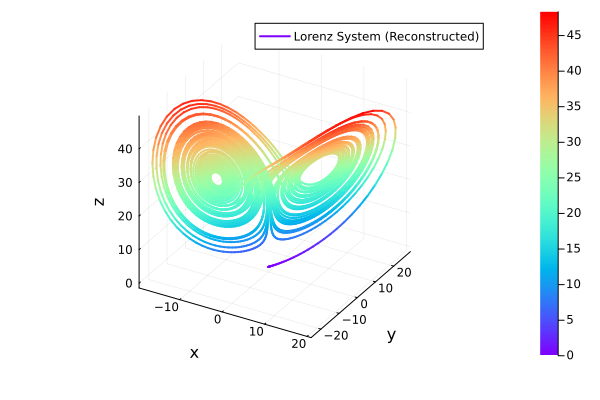

In [44]:
# Extrair as derivadas reconstruídas
xyz_dot_reconstructed = theta_matrix * ξ_values
x_dot_reconstructed = xyz_dot_reconstructed[:, 1]
y_dot_reconstructed = xyz_dot_reconstructed[:, 2]
z_dot_reconstructed = xyz_dot_reconstructed[:, 3]

# Integrar numericamente para obter as variáveis originais
x_reconstructed = cumsum(x_dot_reconstructed) * (t_values[2] - t_values[1])
y_reconstructed = cumsum(y_dot_reconstructed) * (t_values[2] - t_values[1])
z_reconstructed = cumsum(z_dot_reconstructed) * (t_values[2] - t_values[1])

plot_obj = plot(x_reconstructed, y_reconstructed, z_reconstructed, 
     xlabel="x", ylabel="y", zlabel="z", 
     label="Lorenz System (Reconstructed)", 
     linewidth=2, linecolor=:auto, color=:rainbow1, legend=:topright, line_z=z_reconstructed)
display(plot_obj)